Try and find two catgeories that can be combined.

In [1]:
from pathlib import Path
# Load the softmax encodings of the data

from simcoder.similarity import load_mf_encodings

smData = load_mf_encodings(Path('/Volumes/Data/mf_resnet50_softmax'))

# Load the data

allData = load_mf_encodings(Path("/Volumes/Data/mf_dino2")) # load encodings

from simcoder.similarity import l1_norm

allData = l1_norm(allData)


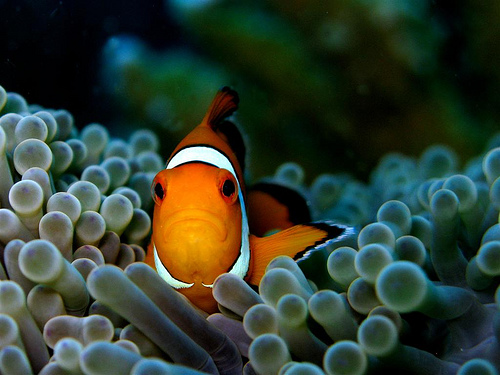

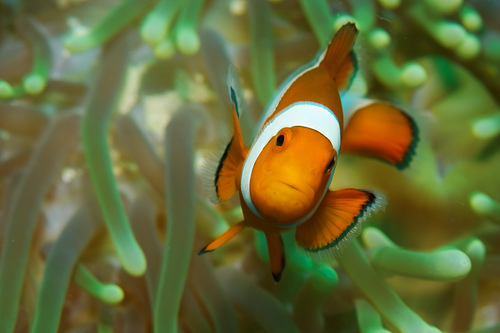

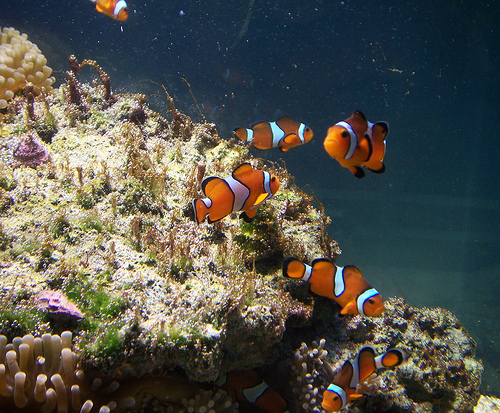

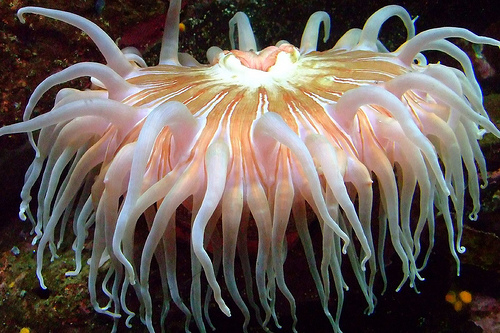

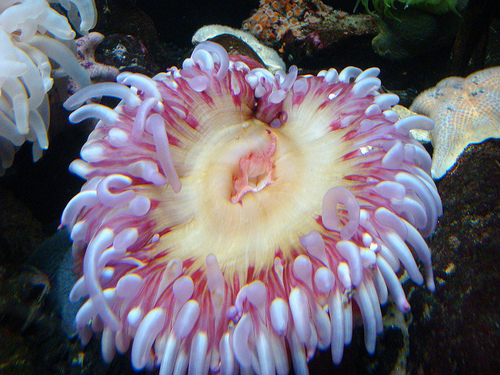

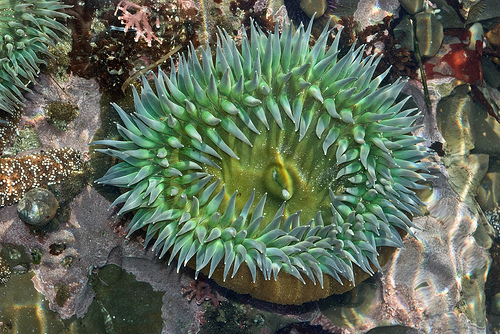

In [11]:
from simcoder.count_cats import get_best_cat_index
from simcoder.similarity import get_mf_image

# subtract 1 from the file numbers

cat1 = 393 # anemone fish
cat2 = 973 # coral reef
cat2 = 108 # sea anemone

indexes_for_cat1 = get_best_cat_index(cat1,smData)
indexes_for_cat2 = get_best_cat_index(cat2,smData)

cat1_index1 = indexes_for_cat1[0]
cat1_index2 = indexes_for_cat1[1]   # clown fish
cat1_index3 = indexes_for_cat1[2]
cat1_index4 = indexes_for_cat1[3]
cat1_index5 = indexes_for_cat1[4]
cat1_index6 = indexes_for_cat1[5]

cat2_index1 = indexes_for_cat2[0]
cat2_index2 = indexes_for_cat2[1]   # anemone
cat2_index3 = indexes_for_cat2[2]

display(get_mf_image(cat1_index1))
display(get_mf_image(cat1_index2))
display(get_mf_image(cat1_index3))
display(get_mf_image(cat2_index1))
display(get_mf_image(cat2_index2))
display(get_mf_image(cat2_index3))

In [3]:
from simcoder.similarity import euclid

def getDists(query_index,allData):
    '''Return the distances from the query to allData'''
    '''Returns an array same dimension as allData of scalars'''
    mf_query_data = allData[query_index]
    distances = euclid(mf_query_data, allData)
    return distances

In [6]:
import numpy as np


dists = getDists(cat1_index1,allData)
closest_indices = np.argsort(dists) # the closest images to the query
poly_query_indexes = closest_indices[0:6] # These are the indices we will use for the poly query
best_100_for_one = closest_indices[0:100]

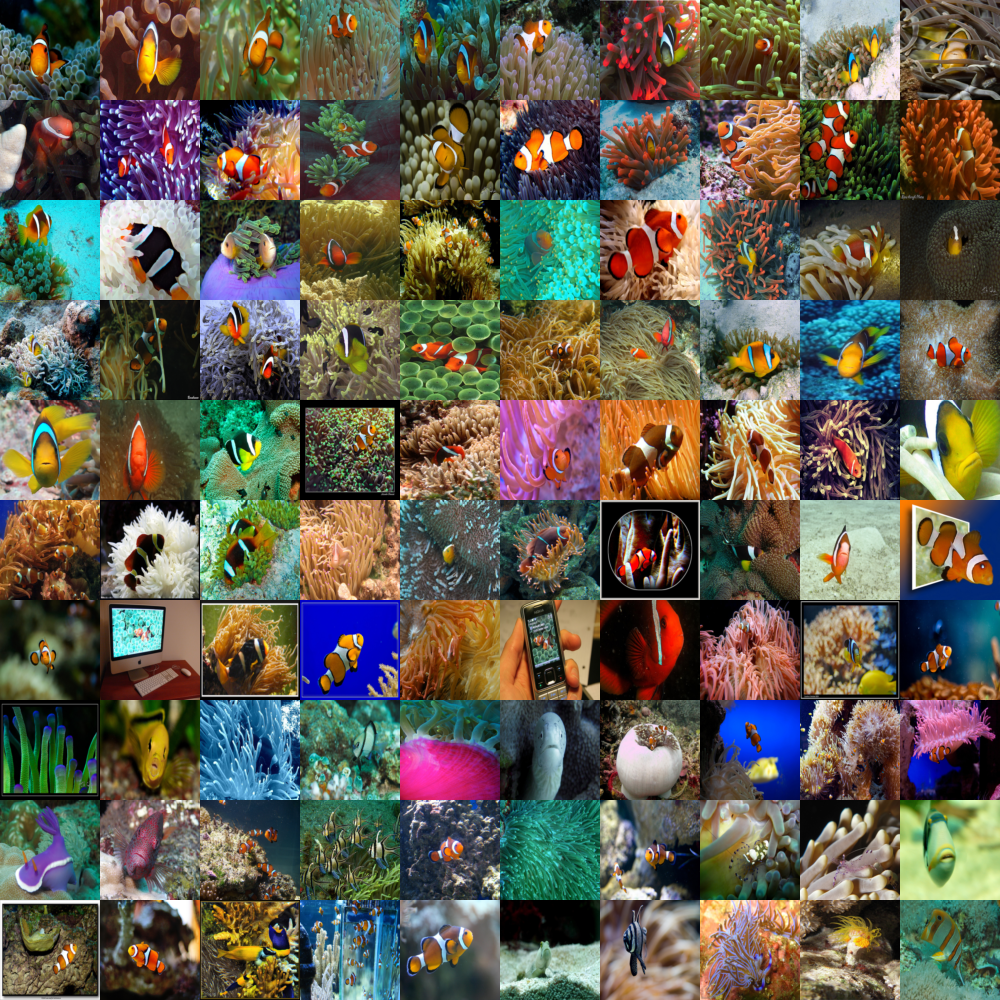

In [9]:
# These are the best images best on lowest average distance from the queries

from simcoder.similarity import make_mf_image_grid

make_mf_image_grid(best_100_for_one,10,10,100,100)

In [22]:
count = 1
for index in best_100_for_one:
    print( index, end='   ' )
    if count % 10 == 0:
        print()
    count = count + 1

224598   115908   279474   280037   111829   465723   194270   457094   529192   983229   
195457   336355   798655   706727   308068   762121   560044   905143   240066   368399   
87642   998764   240570   722831   783816   648116   418226   391483   85511   308099   
423585   108758   932910   305307   939656   178623   719755   528265   327117   422753   
189694   819399   723618   163178   110899   86561   820097   221554   86486   355998   
767145   962778   80130   758883   280233   490969   620589   755595   665708   815469   
950923   777633   268410   332724   2641   18137   819368   408233   98726   521384   
238386   974322   475727   278229   772308   171294   886765   800635   851858   436655   
316056   970304   466687   820163   347040   708665   919873   518591   53568   409980   
933490   202186   654032   825325   920366   765649   914331   968140   320182   279975   


In [70]:
chosen1 = 224598
chosen2 = 798655
chosen3 = 418226
chosen4 = 465723
chosen5 = 87642

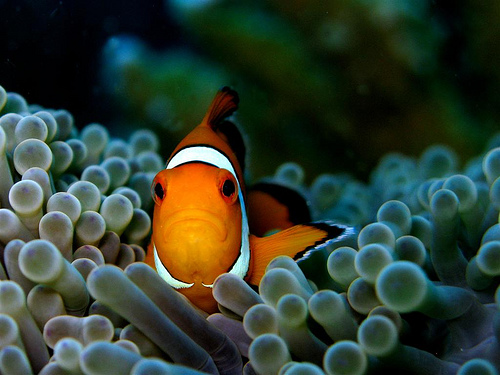

In [49]:
display(get_mf_image(chosen1))

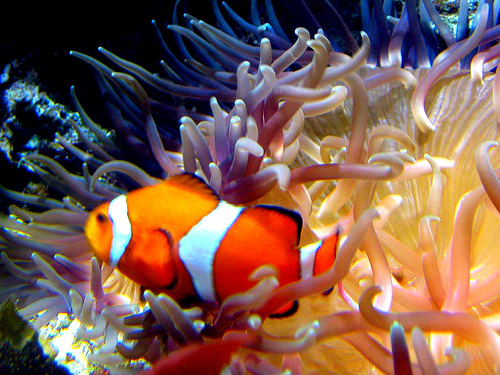

In [52]:
display(get_mf_image(chosen2))

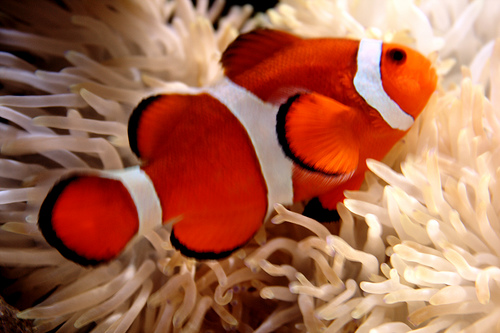

In [71]:
display(get_mf_image(chosen3))

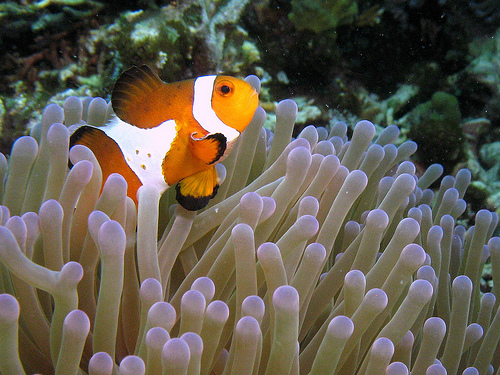

In [62]:
display(get_mf_image(chosen4))

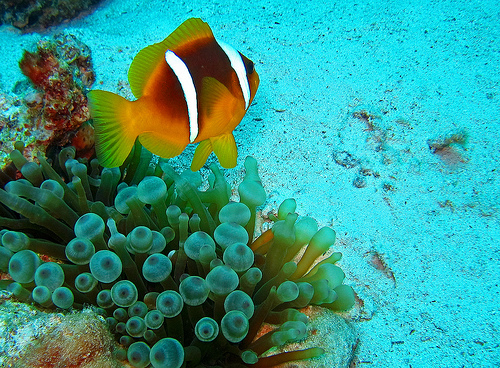

In [57]:
display(get_mf_image(chosen5))

In [72]:
# This is just clown fish 

from simcoder.msedOO import msedOO
import numpy as np

base_data = np.vstack((allData[chosen1],allData[chosen2],allData[chosen3],allData[chosen4]))

# best in all cats: base_data = np.vstack((allData[cat1_index1],allData[cat1_index2],allData[cat1_index3],allData[cat1_index4],allData[cat1_index5],allData[cat1_index6]))   

base = msedOO(base_data)  # form the base simplex 

complexities = base.msed(allData)

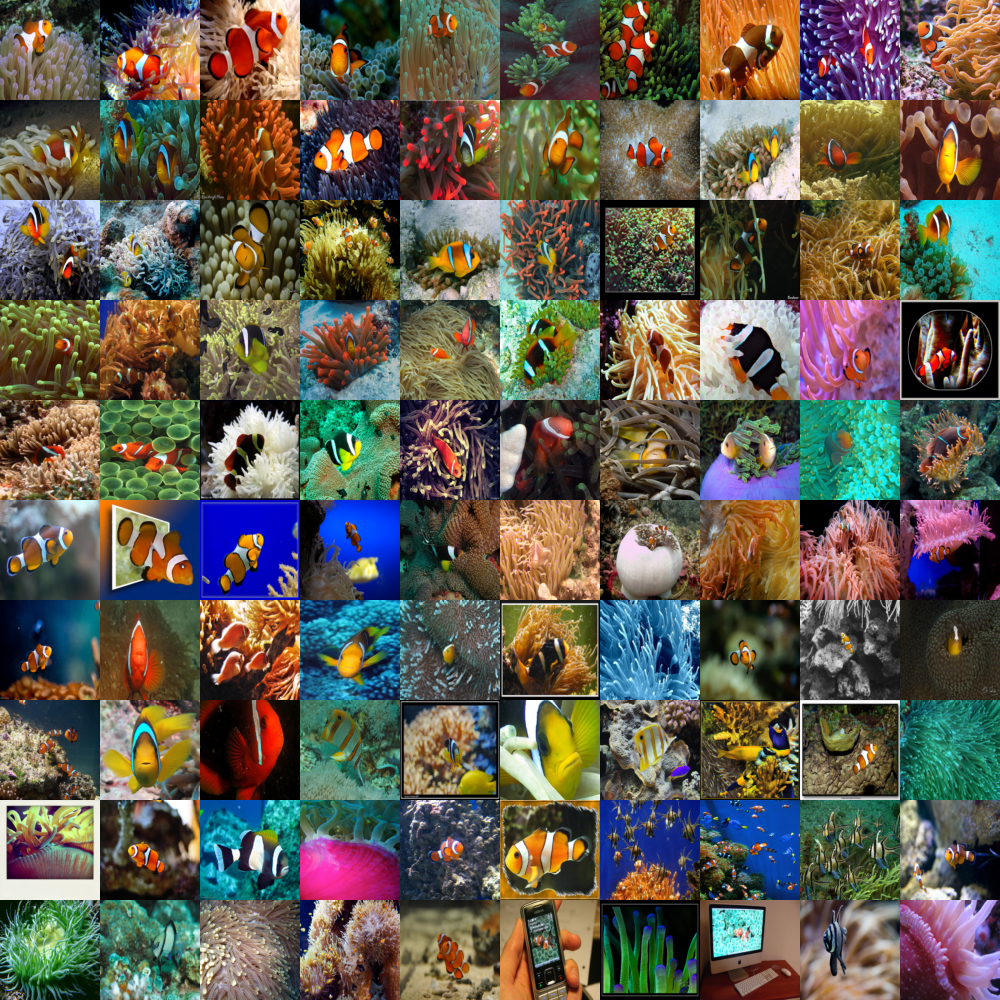

In [73]:
complexities = complexities.flatten() 
indices = np.argsort(complexities)      # lowest is first
top_100_poly = indices[0:100]

from simcoder.similarity import make_mf_image_grid

make_mf_image_grid(top_100_poly,10,10,100,100)

In [74]:
from simcoder.count_cats import count_number_in_cat_gt_thresh, count_number_in_results_cated_as, count_number_in_results_in_cat


max_possible_in_clown = count_number_in_cat_gt_thresh(cat1,0.9,smData)

print(f"num clown (0.9) in data {max_possible_in_clown}")

count_number_in_results_cated_as_clown_one = count_number_in_results_cated_as(cat1, best_100_for_one, smData)
count_number_in_results_cated_as_clown_poly = count_number_in_results_cated_as(cat1, top_100_poly, smData)

print(f"num clown in one {count_number_in_results_cated_as_clown_one}")
print(f"num clown in poly {count_number_in_results_cated_as_clown_poly}")

count_number_in_results_cated_as_clown_one = count_number_in_results_in_cat(cat1, 0.9, best_100_for_one, smData)
count_number_in_results_cated_as_clown_poly = count_number_in_results_in_cat(cat1, 0.9, top_100_poly, smData)

print(f"num clown 0.9 in one {count_number_in_results_cated_as_clown_one}")
print(f"num clown 0.9 in poly {count_number_in_results_cated_as_clown_poly}")

num clown (0.9) in data 68
num clown in one 78
num clown in poly 81
num clown 0.9 in one 58
num clown 0.9 in poly 60


In [12]:
# This is clown fish and anemones

from simcoder.msedOO import msedOO
import numpy as np

base_data = np.vstack((allData[cat1_index1],allData[cat1_index2],allData[cat1_index3],allData[cat2_index1],allData[cat2_index2],allData[cat2_index3]))   

base = msedOO(base_data)  # form the base simplex 

complexities = base.msed(allData)



In [13]:

complexities = complexities.flatten()   # <<< these are all matrices of matrices shouldn't be.
indices = np.argsort(complexities)      # lowest is first
top_100 = indices[0:100]


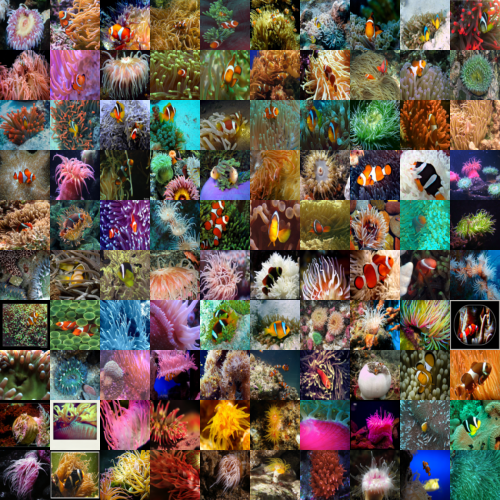

In [14]:
from simcoder.similarity import make_mf_image_grid

make_mf_image_grid(top_100,10,10,50,50)

/Users/al/repos/simcoder-pytorch/simcoder/msedOO.py:17: RuntimeWarning: overflow encountered in exp
  C = np.exp(cs)                              # C is of shape matrix of no_of_objects,1 print(f"C shape {C.shape}")


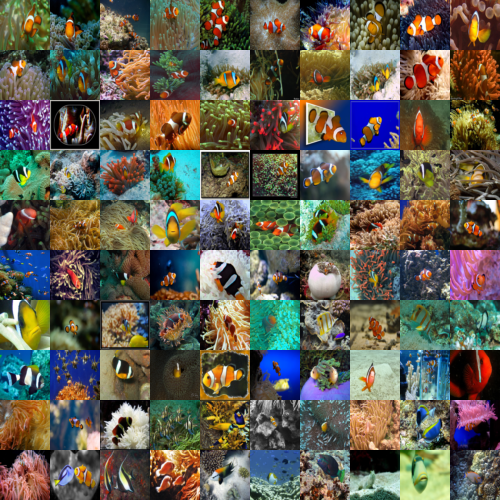

In [ ]:
# now try just bottles

base_data = np.vstack((allData[cat1_index1],allData[cat1_index2],allData[cat1_index3]) )  

base = msedOO(base_data)  # form the base simplex 
complexities = base.msed(allData)
complexities = complexities.flatten()   # <<< these are all matrices of matrices shouldn't be.
indices = np.argsort(complexities)      # lowest is first
top_100 = indices[0:100]
make_mf_image_grid(top_100,10,10,50,50)

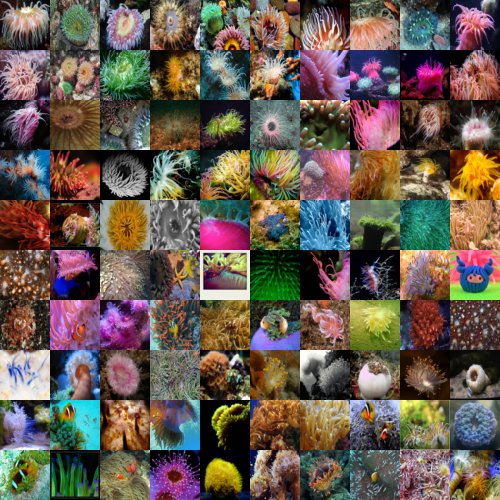

In [ ]:
# now try just glasses

base_data = np.vstack((allData[cat2_index1],allData[cat2_index2],allData[cat2_index3]) )  

base = msedOO(base_data)  # form the base simplex 
complexities = base.msed(allData)
complexities = complexities.flatten()   # <<< these are all matrices of matrices shouldn't be.
indices = np.argsort(complexities)      # lowest is first
top_100 = indices[0:100]
make_mf_image_grid(top_100,10,10,50,50)